# **Project Name**    -



##### **Project Type**    -  Unsupervised
##### **Contribution**    - Individual
##### **Team Member 1**  - Rohit Sonawane

# **Project Summary -**

**Business Context -**

During the last few decades, with the rise of Youtube, Amazon. Netflix, and many other such web services. recommender systems have taken more and more place in our lives. From e-commerce (suggest to buyers articles that could interest them) to online advertisement (suggest to users the right contents, matching their preferences). recommender systems are today unavoidable in our daily online journeys. In a very general way,recommender systems are algorithms aimed at suggesting relevant.

Items to users (items being movies to watch, text to read, products to buy, or anything else depending on industries). Recommender systems are really critical in some industries as they can generate a huge amount of income when they are efficient or also be a way to stand out significantly from competitors. The main objective is to create a book recommendat ion system for users. Dataset Description

The Book-Crossing dataset compr ises 3 f iles. Users: Contains the users. Note that user IDs (User-ID) have been anonymized and map to integers. Demographic data is provided (Location, Age) if available. Otherwise, these f ields contain NULL values. Books: Books are identif ied by their respective ISBN. Invalid ISBNs have already been removed from the dataset. Moreover, some content-based information is given (Book-Title, Book-Author, Year-Of- Publication, Publisher). obtained from Amazon Web Services. Note that in the case of several authors, only the first is provided. URLs linking to cover images are also given.appearing in three different flavours (Image- URL-$, lmage-URL-M,lmage­ URL-L). i.e.,small,medium, large. These URLs point to the Amazon website. Ratings:

Contains the book rating information. Ratings (Book-Rating) are either explicit. expressed on a scale from 1-10 (higher values denoting higher appreciation),or implicit, expressed by 0.

# **GitHub Link -**

GitHub Link - https://github.com/rohit-sonawane9/Unsupervised-ML-Book-Recommendation-System

# **Problem Statement**


During the last few decades, with the rise of Youtube, Amazon, Netflix, and many other such web services, recommender systems have taken more and more place in our lives. From e-commerce (suggest to buyers articles that could interest them) to online advertisement (suggest to users the right contents, matching their preferences). recommender systems are today unavoidable in our daily online journeys.

In a very general way, recommender systems are algorithms aimed at suggesting relevant.
items to users (items being movies to watch, text to read, products to buy, or anything else depending on industries). Recommender systems are really critical in some industries as they can generate a huge amount of income when they are efficient or also be a way to stand out significantly from competitors. The main objective is to create a book recommendation system for users.

# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [1]:
# Import Libraries
import re
import pickle
import operator
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter
from sklearn.neighbors import NearestNeighbors
import scipy
import math
import sklearn
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from scipy.sparse.linalg import svds
from surprise import Dataset, Reader
from surprise import SVD, NMF
from surprise.model_selection import cross_validate, train_test_split, GridSearchCV
from sklearn.neighbors import NearestNeighbors
from scipy.spatial.distance import correlation
from sklearn.metrics.pairwise import pairwise_distances
import ipywidgets as widgets
from IPython.display import display, clear_output
from contextlib import contextmanager
import os, sys
import re
from scipy.sparse import csr_matrix

import warnings
warnings.filterwarnings("ignore")

### Dataset Loading

In [2]:
# Load Dataset
books = pd.read_csv("Books.csv")
users = pd.read_csv("Users.csv")
ratings = pd.read_csv("Ratings.csv")

print("Books Data:    ", books.shape)
print("Users Data:    ", users.shape)
print("Ratings: ", ratings.shape)

Books Data:     (271360, 8)
Users Data:     (278858, 3)
Ratings:  (1149780, 3)


### Dataset First View

In [3]:
# Dataset First Look og books.csv
books.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


In [4]:
# Dataset First Look og Users.csv
users.head()

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


In [5]:
# Dataset First Look og Ratings.csv
ratings.head()

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


### Dataset Rows & Columns count

In [6]:
# Dataset Rows & Columns count of Books.csv
print("Books Rows are:",books.shape[0])
print("Books Columns are:",books.shape[1])


Books Rows are: 271360
Books Columns are: 8


In [7]:
# Dataset Rows & Columns count of Users.csv
print("Users Rows are:",users.shape[0])
print("Users Columns are:",users.shape[1])

Users Rows are: 278858
Users Columns are: 3


In [8]:
# Dataset Rows & Columns count of Ratings.csv
print("Ratings Rows are:",ratings.shape[0])
print("Ratings Columns are:",ratings.shape[1])

Ratings Rows are: 1149780
Ratings Columns are: 3


### Dataset Information

In [9]:
# Dataset Info
books.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271360 entries, 0 to 271359
Data columns (total 8 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   ISBN                 271360 non-null  object
 1   Book-Title           271360 non-null  object
 2   Book-Author          271359 non-null  object
 3   Year-Of-Publication  271360 non-null  object
 4   Publisher            271358 non-null  object
 5   Image-URL-S          271360 non-null  object
 6   Image-URL-M          271360 non-null  object
 7   Image-URL-L          271357 non-null  object
dtypes: object(8)
memory usage: 16.6+ MB


In [10]:
users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278858 entries, 0 to 278857
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   User-ID   278858 non-null  int64  
 1   Location  278858 non-null  object 
 2   Age       168096 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 6.4+ MB


In [11]:
ratings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1149780 entries, 0 to 1149779
Data columns (total 3 columns):
 #   Column       Non-Null Count    Dtype 
---  ------       --------------    ----- 
 0   User-ID      1149780 non-null  int64 
 1   ISBN         1149780 non-null  object
 2   Book-Rating  1149780 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 26.3+ MB


#### Duplicate Values

In [12]:
# Dataset Duplicate Value Count
books.duplicated().sum()

0

In [13]:
users.duplicated().sum()

0

In [14]:
ratings.duplicated().sum()

0

#### Missing Values/Null Values

In [15]:
# Missing Values/Null Values Count
books.isnull().sum()

ISBN                   0
Book-Title             0
Book-Author            1
Year-Of-Publication    0
Publisher              2
Image-URL-S            0
Image-URL-M            0
Image-URL-L            3
dtype: int64

In [16]:
users.isnull().sum()

User-ID          0
Location         0
Age         110762
dtype: int64

In [17]:
ratings.isnull().sum()

User-ID        0
ISBN           0
Book-Rating    0
dtype: int64

<Axes: >

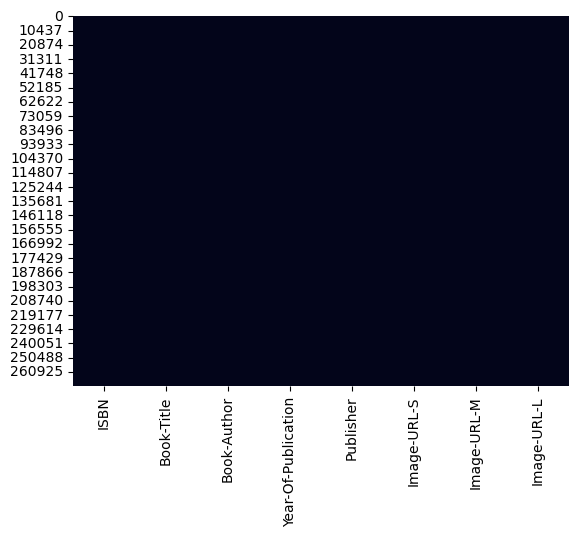

In [18]:
# Visualizing the missing values
# Checking Null Value by plotting Heatmap
sns.heatmap(books.isnull(), cbar=False)

<Axes: >

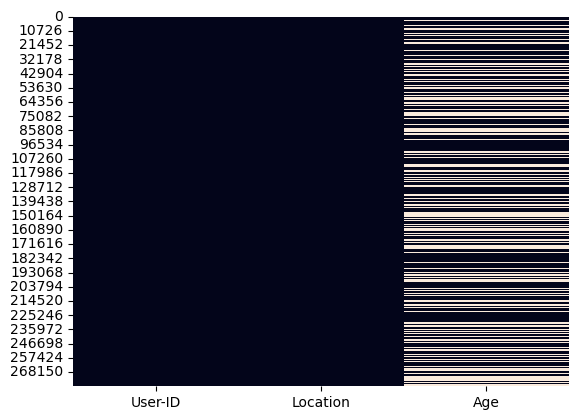

In [19]:
# Checking Null Value by plotting Heatmap
sns.heatmap(users.isnull(), cbar=False)

<Axes: >

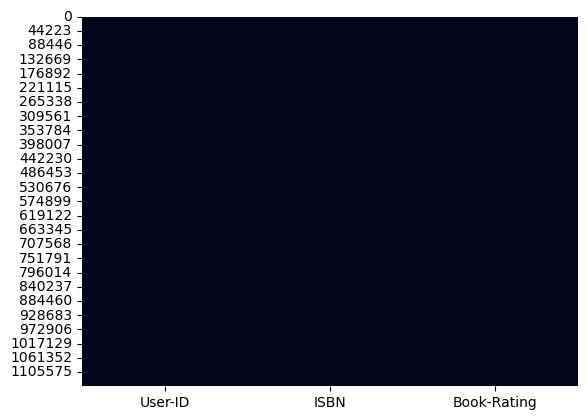

In [20]:
# Checking Null Value by plotting Heatmap
sns.heatmap(ratings.isnull(), cbar=False)

In [21]:
# Drop URL columns in Books.csv
books.drop(['Image-URL-S', 'Image-URL-M', 'Image-URL-L'], axis=1, inplace=True)

In [22]:
books.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company


In [23]:
## Checking for null values
books.isnull().sum()

ISBN                   0
Book-Title             0
Book-Author            1
Year-Of-Publication    0
Publisher              2
dtype: int64

In [24]:
books.loc[books['Book-Author'].isnull(),:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher
187689,9627982032,The Credit Suisse Guide to Managing Your Perso...,NaN,1995,Edinburgh Financial Publishing


In [25]:
books.loc[books['Publisher'].isnull(),:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher
128890,193169656X,Tyrant Moon,Elaine Corvidae,2002,NaN
129037,1931696993,Finders Keepers,Linnea Sinclair,2001,NaN


In [26]:
books.at[187689 ,'Book-Author'] = 'Other'

books.at[128890 ,'Publisher'] = 'Other'
books.at[129037 ,'Publisher'] = 'Other'

In [27]:
books.isnull().sum()

ISBN                   0
Book-Title             0
Book-Author            0
Year-Of-Publication    0
Publisher              0
dtype: int64

In [28]:
pd.set_option('display.max_colwidth', -1)

In [29]:
books.loc[books['Year-Of-Publication'] == 'DK Publishing Inc',:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher
209538,078946697X,"DK Readers: Creating the X-Men, How It All Began (Level 4: Proficient Readers)\"";Michael Teitelbaum""",2000,DK Publishing Inc,http://images.amazon.com/images/P/078946697X.01.THUMBZZZ.jpg
221678,0789466953,"DK Readers: Creating the X-Men, How Comic Books Come to Life (Level 4: Proficient Readers)\"";James Buckley""",2000,DK Publishing Inc,http://images.amazon.com/images/P/0789466953.01.THUMBZZZ.jpg


In [30]:
books.loc[books['Year-Of-Publication'] == 'Gallimard',:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher
220731,2070426769,"Peuple du ciel, suivi de 'Les Bergers\"";Jean-Marie Gustave Le ClÃ?Â©zio""",2003,Gallimard,http://images.amazon.com/images/P/2070426769.01.THUMBZZZ.jpg


In [31]:
books.at[209538 ,'Publisher'] = 'DK Publishing Inc'
books.at[209538 ,'Year-Of-Publication'] = 2000
books.at[209538 ,'Book-Title'] = 'DK Readers: Creating the X-Men, How It All Began (Level 4: Proficient Readers)'
books.at[209538 ,'Book-Author'] = 'Michael Teitelbaum'

books.at[221678 ,'Publisher'] = 'DK Publishing Inc'
books.at[221678 ,'Year-Of-Publication'] = 2000
books.at[209538 ,'Book-Title'] = 'DK Readers: Creating the X-Men, How Comic Books Come to Life (Level 4: Proficient Readers)'
books.at[209538 ,'Book-Author'] = 'James Buckley'

books.at[220731 ,'Publisher'] = 'Gallimard'
books.at[220731 ,'Year-Of-Publication'] = '2003'
books.at[209538 ,'Book-Title'] = 'Peuple du ciel - Suivi de Les bergers '
books.at[209538 ,'Book-Author'] = 'Jean-Marie Gustave Le ClÃ?Â©zio'

In [32]:
books['Year-Of-Publication'] = books['Year-Of-Publication'].astype(int)

In [33]:
print(sorted(list(books['Year-Of-Publication'].unique())))

[0, 1376, 1378, 1806, 1897, 1900, 1901, 1902, 1904, 1906, 1908, 1909, 1910, 1911, 1914, 1917, 1919, 1920, 1921, 1922, 1923, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931, 1932, 1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942, 1943, 1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2008, 2010, 2011, 2012, 2020, 2021, 2024, 2026, 2030, 2037, 2038, 2050]


In [34]:
## Replacing Invalid years with max year
count = Counter(books['Year-Of-Publication'])
[k for k, v in count.items() if v == max(count.values())]

[2002]

In [35]:
books.loc[books['Year-Of-Publication'] > 2021, 'Year-Of-Publication'] = 2002
books.loc[books['Year-Of-Publication'] == 0, 'Year-Of-Publication'] = 2002

In [36]:
## Uppercasing all alphabets in ISBN
books['ISBN'] = books['ISBN'].str.upper()

In [37]:
## Drop duplicate rows
books.drop_duplicates(keep='last', inplace=True)
books.reset_index(drop = True, inplace = True)

In [38]:
books.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271047 entries, 0 to 271046
Data columns (total 5 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   ISBN                 271047 non-null  object
 1   Book-Title           271047 non-null  object
 2   Book-Author          271047 non-null  object
 3   Year-Of-Publication  271047 non-null  int32 
 4   Publisher            271047 non-null  object
dtypes: int32(1), object(4)
memory usage: 9.3+ MB


In [39]:
books.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial
3,0374157065,Flu: The Story of the Great Influenza Pandemic of 1918 and the Search for the Virus That Caused It,Gina Bari Kolata,1999,Farrar Straus Giroux
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company


##### User dataset

In [40]:
users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278858 entries, 0 to 278857
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   User-ID   278858 non-null  int64  
 1   Location  278858 non-null  object 
 2   Age       168096 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 6.4+ MB


In [41]:
## Check for all values present in Age column
print(sorted(list(users['Age'].unique())))

[nan, 0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 96.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 113.0, 114.0, 115.0, 116.0, 118.0, 119.0, 123.0, 124.0, 127.0, 128.0, 132.0, 133.0, 136.0, 137.0, 138.0, 140.0, 141.0, 143.0, 146.0, 147.0, 148.0, 151.0, 152.0, 156.0, 157.0, 159.0, 162.0, 168.0, 172.0, 175.0, 183.0, 186.0, 189.0, 199.0, 200.0, 201.0, 204.0, 207.0, 208.0, 209.0, 210.0, 212.0, 219.0, 220.0, 223.0, 226.0

In [42]:
required = users[users['Age'] <= 80]
required = required[required['Age'] >= 10]

In [43]:
mean = round(required['Age'].mean())
mean

35

In [44]:
users.loc[users['Age'] > 80, 'Age'] = mean    #outliers with age grater than 80 are substituted with mean
users.loc[users['Age'] < 10, 'Age'] = mean    #outliers with age less than 10 years are substitued with mean
users['Age'] = users['Age'].fillna(mean)      #filling null values with mean
users['Age'] = users['Age'].astype(int)       #changing Datatype to int

In [45]:
list_ = users.Location.str.split(', ')

city = []
state = []
country = []
count_no_state = 0
count_no_country = 0

for i in range(0,len(list_)):
    if list_[i][0] == ' ' or list_[i][0] == '' or list_[i][0]=='n/a' or list_[i][0] == ',':  #removing invalid entries too
        city.append('other')
    else:
        city.append(list_[i][0].lower())

    if(len(list_[i])<2):
        state.append('other')
        country.append('other')
        count_no_state += 1
        count_no_country += 1
    else:
        if list_[i][1] == ' ' or list_[i][1] == '' or list_[i][1]=='n/a' or list_[i][1] == ',':   #removing invalid entries
            state.append('other')
            count_no_state += 1
        else:
            state.append(list_[i][1].lower())

        if(len(list_[i])<3):
            country.append('other')
            count_no_country += 1
        else:
            if list_[i][2] == ''or list_[i][1] == ',' or list_[i][2] == ' ' or list_[i][2] == 'n/a':
                country.append('other')
                count_no_country += 1
            else:
                country.append(list_[i][2].lower())

users = users.drop('Location',axis=1)

temp = []
for ent in city:
    c = ent.split('/')            #handling cases where city/state entries from city list as state is already given
    temp.append(c[0])

df_city = pd.DataFrame(temp,columns=['City'])
df_state = pd.DataFrame(state,columns=['State'])
df_country = pd.DataFrame(country,columns=['Country'])

users = pd.concat([users, df_city], axis=1)
users = pd.concat([users, df_state], axis=1)
users = pd.concat([users, df_country], axis=1)

print("Number of entries without a state:", count_no_state)
print("Number of entries without a country:", count_no_country)

Number of entries without a state: 16044
Number of entries without a country: 4659


In [46]:
# Drop duplicate rows
users.drop_duplicates(keep='last', inplace=True)
users.reset_index(drop=True, inplace=True)

In [47]:
users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278858 entries, 0 to 278857
Data columns (total 5 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   User-ID  278858 non-null  int64 
 1   Age      278858 non-null  int32 
 2   City     278858 non-null  object
 3   State    278858 non-null  object
 4   Country  278858 non-null  object
dtypes: int32(1), int64(1), object(3)
memory usage: 9.6+ MB


In [48]:
users.head()

,User-ID,Age,City,State,Country
0,1,35,nyc,new york,usa
1,2,18,stockton,california,usa
2,3,35,moscow,yukon territory,russia
3,4,17,porto,v.n.gaia,portugal
4,5,35,farnborough,hants,united kingdom


##### Ratings dataset

In [49]:
ratings

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6
...,...,...,...
1149775,276704,1563526298,9
1149776,276706,0679447156,0
1149777,276709,0515107662,10
1149778,276721,0590442449,10


In [50]:
ratings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1149780 entries, 0 to 1149779
Data columns (total 3 columns):
 #   Column       Non-Null Count    Dtype 
---  ------       --------------    ----- 
 0   User-ID      1149780 non-null  int64 
 1   ISBN         1149780 non-null  object
 2   Book-Rating  1149780 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 26.3+ MB


In [51]:
## checking ISBN
flag = 0
k =[]
reg = "[^A-Za-z0-9]"

for x in ratings['ISBN']:
    z = re.search(reg,x)
    if z:
        flag = 1

if flag == 1:
    print("False")
else:
    print("True")

False


In [52]:
## removing extra characters from ISBN (from ratings dataset) existing in books dataset
bookISBN = books['ISBN'].tolist()
reg = "[^A-Za-z0-9]"
for index, row_Value in ratings.iterrows():
    z = re.search(reg, row_Value['ISBN'])
    if z:
        f = re.sub(reg,"",row_Value['ISBN'])
        if f in bookISBN:
            ratings.at[index , 'ISBN'] = f

In [53]:
## Uppercasing all alphabets in ISBN
ratings['ISBN'] = ratings['ISBN'].str.upper()

In [54]:
## Drop duplicate rows
ratings.drop_duplicates(keep='last', inplace=True)
ratings.reset_index(drop=True, inplace=True)

In [55]:
ratings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1149776 entries, 0 to 1149775
Data columns (total 3 columns):
 #   Column       Non-Null Count    Dtype 
---  ------       --------------    ----- 
 0   User-ID      1149776 non-null  int64 
 1   ISBN         1149776 non-null  object
 2   Book-Rating  1149776 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 26.3+ MB


# ***Data Wrangling***

## Data Wrangling Code

### Merging All dataset

In [56]:
ds = pd.merge(books, ratings, on='ISBN', how='inner')
ds = pd.merge(ds, users, on='User-ID', how='inner')
ds.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1031609 entries, 0 to 1031608
Data columns (total 11 columns):
 #   Column               Non-Null Count    Dtype 
---  ------               --------------    ----- 
 0   ISBN                 1031609 non-null  object
 1   Book-Title           1031609 non-null  object
 2   Book-Author          1031609 non-null  object
 3   Year-Of-Publication  1031609 non-null  int32 
 4   Publisher            1031609 non-null  object
 5   User-ID              1031609 non-null  int64 
 6   Book-Rating          1031609 non-null  int64 
 7   Age                  1031609 non-null  int32 
 8   City                 1031609 non-null  object
 9   State                1031609 non-null  object
 10  Country              1031609 non-null  object
dtypes: int32(2), int64(2), object(7)
memory usage: 86.6+ MB


In [57]:
ds.head(5)

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,User-ID,Book-Rating,Age,City,State,Country
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,2,0,18,stockton,california,usa
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,8,5,35,timmins,ontario,canada
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,8,0,35,timmins,ontario,canada
3,0374157065,Flu: The Story of the Great Influenza Pandemic of 1918 and the Search for the Virus That Caused It,Gina Bari Kolata,1999,Farrar Straus Giroux,8,0,35,timmins,ontario,canada
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,8,0,35,timmins,ontario,canada


In [58]:
ds.isnull().sum()

ISBN                   0
Book-Title             0
Book-Author            0
Year-Of-Publication    0
Publisher              0
User-ID                0
Book-Rating            0
Age                    0
City                   0
State                  0
Country                0
dtype: int64

### Making Copy of Dataset

In [59]:
# Before doing any data wrangling lets create copy of the dataset
ds_2 = ds.copy()

#### Divide complete data on the basis of Implicit and Explicit ratings datasets

##### Explicit Ratings Dataset : dataset1

In [60]:
ratings_new = ratings[ratings.ISBN.isin(books.ISBN)]
ratings.shape,ratings_new.shape

((1149776, 3), (1031472, 3))

In [61]:
print("Shape of dataset before dropping",ratings_new.shape)
ratings_new = ratings_new[ratings_new['User-ID'].isin(users['User-ID'])]
print("shape of dataset after dropping",ratings_new.shape)

Shape of dataset before dropping (1031472, 3)
shape of dataset after dropping (1031472, 3)


In [62]:
#Hence segragating implicit and explict ratings datasets
ratings_explicit = ratings_new[ratings_new['Book-Rating'] != 0]
ratings_implicit = ratings_new[ratings_new['Book-Rating'] == 0]

In [63]:
print('ratings_explicit dataset shape',ratings_explicit.shape)
print('ratings_implicit dataset',ratings_implicit.shape)

ratings_explicit dataset shape (384024, 3)
ratings_implicit dataset (647448, 3)


In [64]:
## Explicit Ratings Dataset
dataset1 = ds[ds['Book-Rating'] != 0]
dataset1 = dataset1.reset_index(drop = True)
dataset1.shape

(384074, 11)

In [65]:
dataset1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 384074 entries, 0 to 384073
Data columns (total 11 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   ISBN                 384074 non-null  object
 1   Book-Title           384074 non-null  object
 2   Book-Author          384074 non-null  object
 3   Year-Of-Publication  384074 non-null  int32 
 4   Publisher            384074 non-null  object
 5   User-ID              384074 non-null  int64 
 6   Book-Rating          384074 non-null  int64 
 7   Age                  384074 non-null  int32 
 8   City                 384074 non-null  object
 9   State                384074 non-null  object
 10  Country              384074 non-null  object
dtypes: int32(2), int64(2), object(7)
memory usage: 29.3+ MB


##### Implicit Ratings Dataset : dataset2

In [66]:
## Implicit Ratings Dataset
dataset2 = ds[ds['Book-Rating'] == 0]
dataset2 = dataset2.reset_index(drop = True)
dataset2.shape

(647535, 11)

In [67]:
# first look of dataset2
dataset2.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,User-ID,Book-Rating,Age,City,State,Country
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,2,0,18,stockton,california,usa
1,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,8,0,35,timmins,ontario,canada
2,0374157065,Flu: The Story of the Great Influenza Pandemic of 1918 and the Search for the Virus That Caused It,Gina Bari Kolata,1999,Farrar Straus Giroux,8,0,35,timmins,ontario,canada
3,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,8,0,35,timmins,ontario,canada
4,0399135782,The Kitchen God's Wife,Amy Tan,1991,Putnam Pub Group,8,0,35,timmins,ontario,canada


In [68]:
# dataset1 first look
dataset1.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,User-ID,Book-Rating,Age,City,State,Country
0,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,8,5,35,timmins,ontario,canada
1,074322678X,Where You'll Find Me: And Other Stories,Ann Beattie,2002,Scribner,8,5,35,timmins,ontario,canada
2,0887841740,The Middle Stories,Sheila Heti,2004,House of Anansi Press,8,5,35,timmins,ontario,canada
3,1552041778,Jane Doe,R. J. Kaiser,1999,Mira Books,8,5,35,timmins,ontario,canada
4,1567407781,The Witchfinder (Amos Walker Mystery Series),Loren D. Estleman,1998,Brilliance Audio - Trade,8,6,35,timmins,ontario,canada


#### Merging dataset

In [69]:
Final_Dataset=users.copy()
Final_Dataset=pd.merge(Final_Dataset,ratings_explicit,on='User-ID')
Final_Dataset=pd.merge(Final_Dataset,books,on='ISBN')

In [70]:
Final_Dataset.head()

,User-ID,Age,City,State,Country,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher
0,8,35,timmins,ontario,canada,0002005018,5,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada
1,11676,35,other,other,other,0002005018,8,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada
2,67544,30,toronto,ontario,canada,0002005018,8,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada
3,116866,35,ottawa,other,other,0002005018,9,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada
4,123629,35,kingston,ontario,canada,0002005018,9,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada


### What does you get from dataset

This dataset is of Books,Users and user ratings on those books.It have various column like 'ISBN', 'Book-Title', 'Book-Author', 'Year-Of-Publication', 'Publisher','User-ID', 'Book-Rating', 'Age', 'City', 'State', 'Country'.

### ***Understanding Your Variables***

In [71]:
# Dataset Columns
ds.columns

Index(['ISBN', 'Book-Title', 'Book-Author', 'Year-Of-Publication', 'Publisher',
       'User-ID', 'Book-Rating', 'Age', 'City', 'State', 'Country'],
      dtype='object')

In [72]:
# Dataset Describe (all columns included)
ds.describe(include= 'all').round(2)

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,User-ID,Book-Rating,Age,City,State,Country
count,1031609,1031609,1031609,1031609.00,1031609,1031609.00,1031609.00,1031609.00,1031609,1031609,1031609
unique,269845,241073,101590,NaN,16727,NaN,NaN,NaN,14700,2125,389
top,0971880107,Wild Animus,Stephen King,NaN,Ballantine Books,NaN,NaN,NaN,toronto,california,usa
freq,2502,2502,10054,NaN,34730,NaN,NaN,NaN,15132,106815,746130
mean,NaN,NaN,NaN,1995.39,NaN,140594.92,2.84,36.54,NaN,NaN,NaN
std,NaN,NaN,NaN,7.35,NaN,80523.87,3.85,10.14,NaN,NaN,NaN
min,NaN,NaN,NaN,1376.00,NaN,2.00,0.00,10.00,NaN,NaN,NaN
25%,NaN,NaN,NaN,1992.00,NaN,70415.00,0.00,31.00,NaN,NaN,NaN
50%,NaN,NaN,NaN,1997.00,NaN,141210.00,0.00,35.00,NaN,NaN,NaN
75%,NaN,NaN,NaN,2001.00,NaN,211426.00,7.00,41.00,NaN,NaN,NaN


### Variables Description

'ISBN' - International Standard Book Number
'Book-Title' - Title of Book
'Book-Author' - Author of Book
'Year-Of-Publication' - Year of book Published
'Publisher' - Name of Publisher
'User-ID' - User ID Number who used book and giving Rating
'Book-Rating' - rating to book between 0-10
'Age' -  Age of User
'City' - City of User
'State' - State of User
'Country' - Country of user

### Check Unique Values for each variable.

In [73]:
# Check Unique Values for each variable using a for loop
for i in ds.columns.tolist():
  print("No. of unique values in",i,"is",ds[i].nunique())

No. of unique values in ISBN is 269845
No. of unique values in Book-Title is 241073
No. of unique values in Book-Author is 101590
No. of unique values in Year-Of-Publication is 109
No. of unique values in Publisher is 16727
No. of unique values in User-ID is 92185
No. of unique values in Book-Rating is 11
No. of unique values in Age is 71
No. of unique values in City is 14700
No. of unique values in State is 2125
No. of unique values in Country is 389


### What all manipulations have you done and insights you found?

1. Changing faulty data entry to right column in which it should be.
2. Filling NA/NULL values to as per requirement of Column of Dataset.

# Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables

## Chart - 1

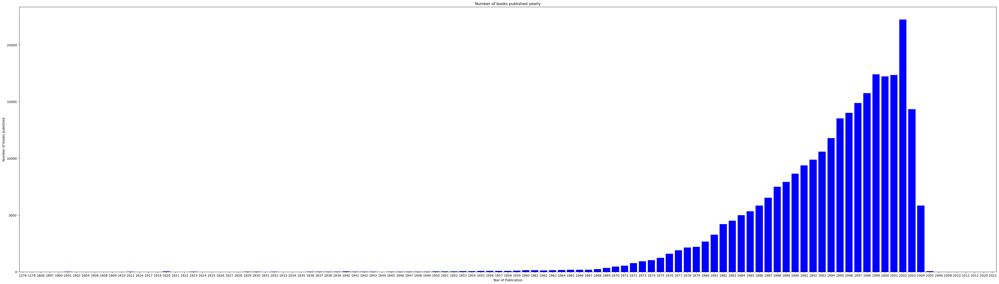

In [74]:
# Chart - 1 visualization code
publications = {}
for year in books['Year-Of-Publication']:
    if str(year) not in publications:
        publications[str(year)] = 0
    publications[str(year)] +=1

publications = {k:v for k, v in sorted(publications.items())}

fig = plt.figure(figsize =(55, 15))
plt.bar(list(publications.keys()),list(publications.values()), color = 'blue')
plt.ylabel("Number of books published")
plt.xlabel("Year of Publication")
plt.title("Number of books published yearly")
plt.margins(x = 0)
plt.show()

##### 1. Why did you pick the specific chart?

To visualize Numbers of book published by Years in given dataset.

##### 2. What is/are the insight(s) found from the chart?

We found that most of books are published on large scale in early 1970.
In 2002 maximum number of books were published.
after that book publication slow down.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

No specific reason is given in dataset.

## Chart - 2

Text(0.5, 1.0, 'No of books by an author (Top 15)')

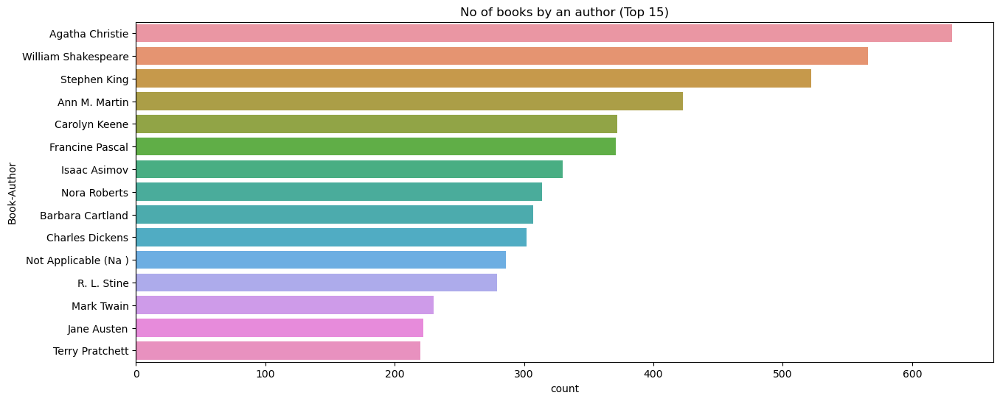

In [75]:
# Chart - 2 visualization code
plt.figure(figsize=(15,6))
sns.countplot(y="Book-Author", data=books,order=books['Book-Author'].value_counts().index[0:15])
plt.title("No of books by an author (Top 15)")

##### 1. Why did you pick the specific chart?

TO check which Author has published maximum number of books.

##### 2. What is/are the insight(s) found from the chart?

Author - Agatha Christie has write books more than 600.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

There is no specific reason , but maybe Write or Author has maximum book with Nice Ratings.

## Chart - 3

Text(0.5, 1.0, 'No of books published by a publisher (Top 15)')

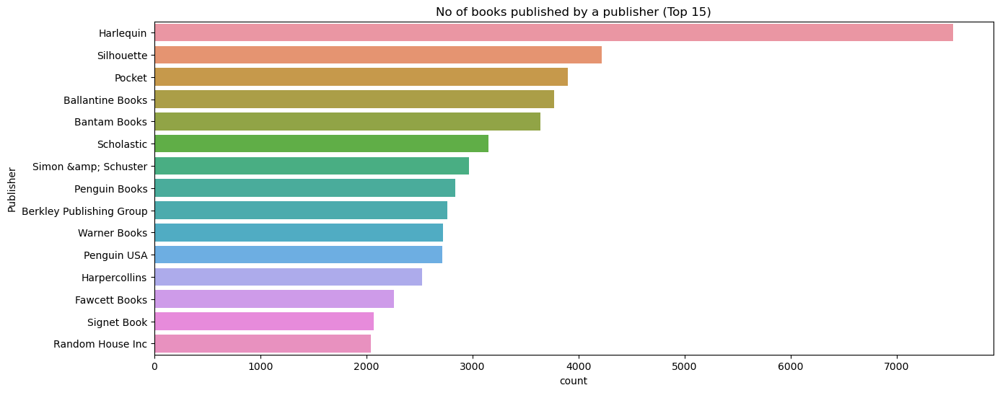

In [76]:
# Chart - 3 visualization code
plt.figure(figsize=(15,6))
sns.countplot(y="Publisher", data=books,order=books['Publisher'].value_counts().index[0:15])
plt.title("No of books published by a publisher (Top 15)")

##### 1. Why did you pick the specific chart?

TO check which Publisher has published maximum number of books.

##### 2. What is/are the insight(s) found from the chart?

Publisher name - Harlequin has published More than 7000 books.

## Chart - 4

<Axes: xlabel='Book-Rating', ylabel='count'>

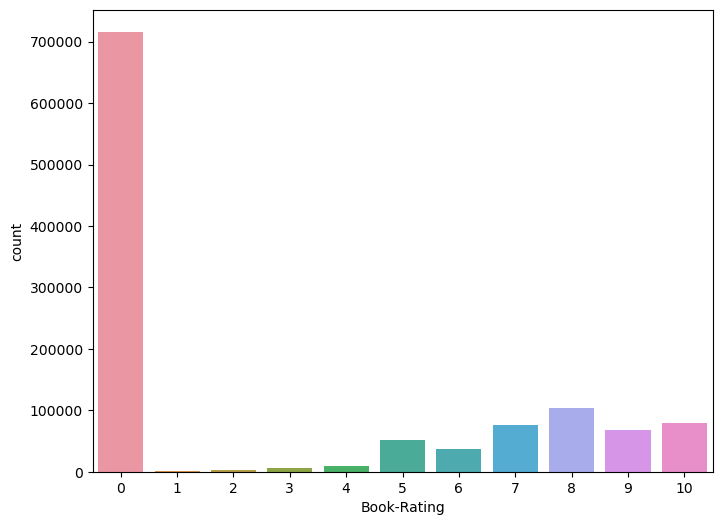

In [77]:
# Chart - 4 visualization code
plt.figure(figsize=(8,6))
sns.countplot(x="Book-Rating", data=ratings)

##### 1. Why did you pick the specific chart?

To check Number of books with various Book-Ratings.

##### 2. What is/are the insight(s) found from the chart?

Maximum number of Books are in  0 Ratings column.

## Chart - 5

Text(0.5, 1.0, 'Explicit Ratings')

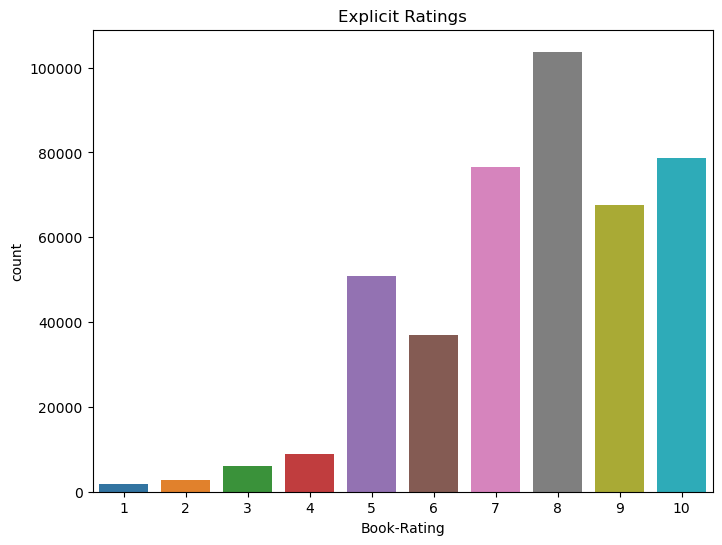

In [78]:
# Chart - 5 visualization code
## Explicit Ratings
plt.figure(figsize=(8,6))
data = ratings[ratings['Book-Rating'] != 0]
sns.countplot(x="Book-Rating", data=data)
plt.title("Explicit Ratings")

##### 1. Why did you pick the specific chart?

To check Distribution of book of numbers other than 0 Rating books.

##### 2. What is/are the insight(s) found from the chart?

Rating -8 has more commonly rating number in dataset other than 0 rating data.

## Chart - 6

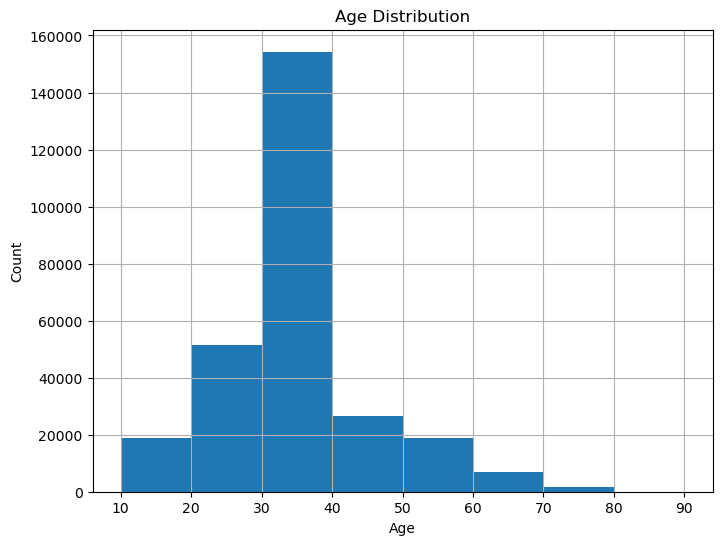

In [79]:
# Chart - 6 visualization code
plt.figure(figsize=(8,6))
users.Age.hist(bins=[10*i for i in range(1, 10)])
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

##### 1. Why did you pick the specific chart?

To check which age group of Users reading more books.

##### 2. What is/are the insight(s) found from the chart?

1. 30 - 40 age group read more books around 150000 plus books.
2. 20-30 , 30-40, 40-50 age group contains around 220000 plus books of dataset.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

This is positive thing because 20-30 age group is learning new things from group and
age group of 20-30,30-40, 40-50 are able to buy books by themselves.

## Chart - 7

Text(0.5, 1.0, 'No of readers from each city (Top 15)')

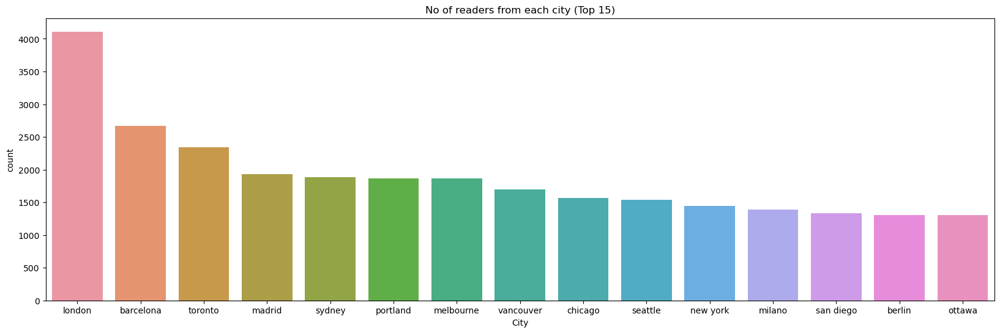

In [80]:
# Chart - 7 visualization code
plt.figure(figsize=(20,6))
sns.countplot(x="City", data=users,order=users['City'].value_counts().index[0:15])
plt.title("No of readers from each city (Top 15)")

##### 1. Why did you pick the specific chart?

To visualize numbers of books Citywise.

##### 2. What is/are the insight(s) found from the chart?

Landon Reads more number of books as per dataset.
Ottawa reads less number of books.

## Chart - 8

Text(0.5, 1.0, 'No of readers from each country (Top 10)')

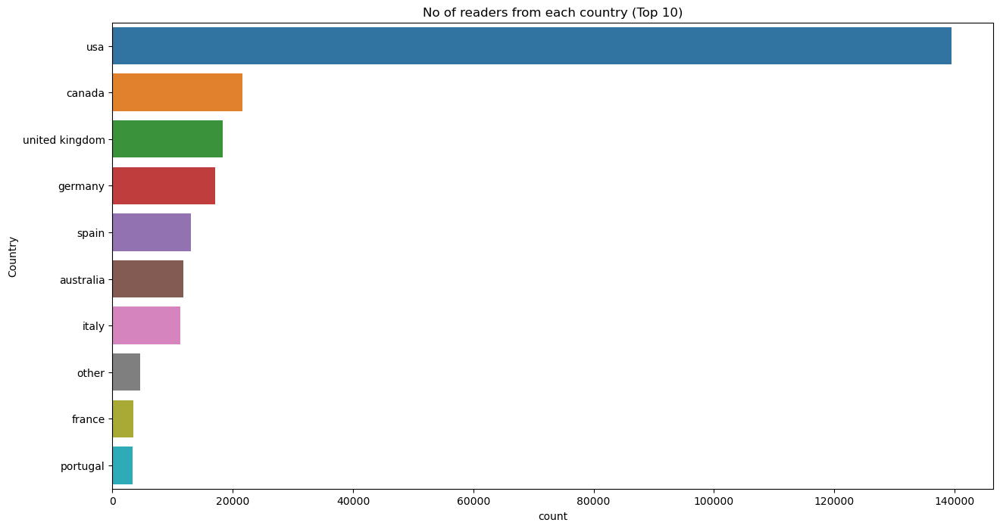

In [81]:
# Chart - 9 visualization code
plt.figure(figsize=(15,8))
sns.countplot(y="Country", data=users, order=users['Country'].value_counts().index[0:10])
plt.title("No of readers from each country (Top 10)")

##### 1. Why did you pick the specific chart?

To visualize numbers of book reader as per country.

##### 2. What is/are the insight(s) found from the chart?

USA has more number of readers

## Chart - 9

Text(0.5, 1.0, 'No of readers from states of USA (Top 15)')

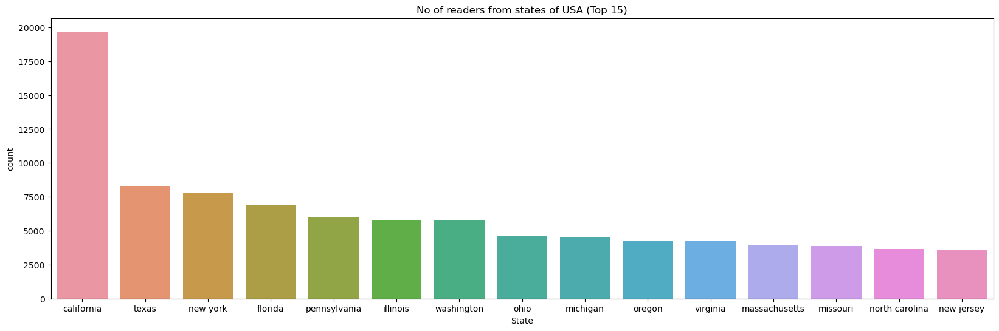

In [82]:
# Chart - 10 visualization code
data=users[users['Country']=='usa']
plt.figure(figsize=(20,6))
sns.countplot(x="State", data=data,order=data['State'].value_counts().index[0:15])
plt.title("No of readers from states of USA (Top 15)")

##### 1. Why did you pick the specific chart?

To visualize Statewise No. of reader in USA

##### 2. What is/are the insight(s) found from the chart?

California state has more readers.

## Chart - 10

Text(0.5, 1.0, 'Number of Ratings for a book (Top 15)')

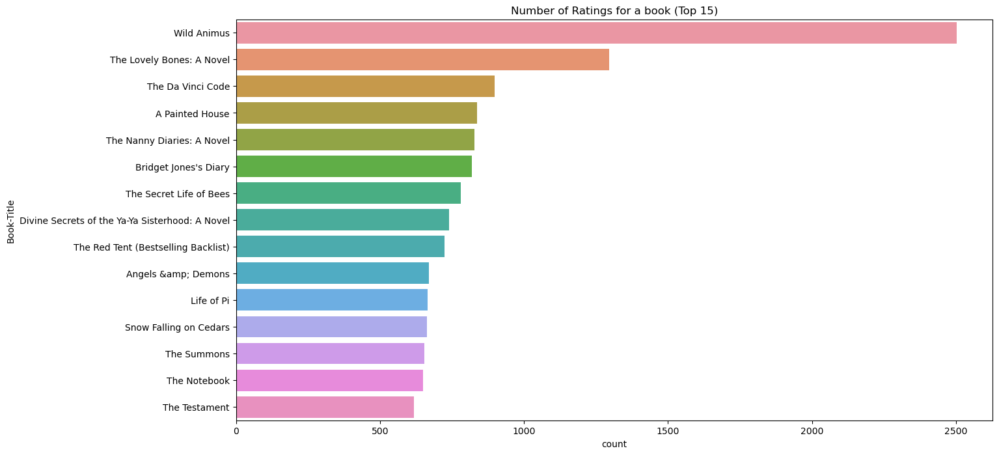

In [83]:
# Chart - 11 visualization code
plt.figure(figsize=(15,8))
sns.countplot(y="Book-Title", data=ds_2, order=ds_2['Book-Title'].value_counts().index[0:15])
plt.title("Number of Ratings for a book (Top 15)")

##### 1. Why did you pick the specific chart?

To visualize which books gets more number of ratings.

##### 2. What is/are the insight(s) found from the chart?

Book name - 'Wild Animus' has more ratings.

# Recommendation Systems

In [84]:
bookName = input("Enter a book name: ")
number = int(input("Enter number of books to recommend: "))

# Harry Potter and the Sorcerer's Stone (Harry Potter (Paperback))

Enter a book name: Harry Potter and the Sorcerer's Stone
Enter number of books to recommend: 5


## Popularity Based (Top In whole collection)

In [85]:
def popularity_based(dataframe, n):
    if n >= 1 and n <= len(dataframe):
        data = pd.DataFrame(dataframe.groupby('ISBN')['Book-Rating'].count()).sort_values('Book-Rating', ascending=False).head(n)
        result = pd.merge(data, books, on='ISBN')
        return result
    return "Invalid number of books entered!!"

In [86]:
print("Top", number, "Popular books are: ")
popularity_based(dataset1, number)

Top 5 Popular books are: 


,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher
0,0316666343,707,The Lovely Bones: A Novel,Alice Sebold,2002,"Little, Brown"
1,0971880107,581,Wild Animus,Rich Shapero,2004,Too Far
2,0385504209,488,The Da Vinci Code,Dan Brown,2003,Doubleday
3,0312195516,383,The Red Tent (Bestselling Backlist),Anita Diamant,1998,Picador USA
4,0060928336,320,Divine Secrets of the Ya-Ya Sisterhood: A Novel,Rebecca Wells,1997,Perennial


## Popularity Based (Top In a given place)

In [87]:
def search_unique_places(dataframe, place):
    place = place.lower()

    if place in list(dataframe['City'].unique()):
        return dataframe[dataframe['City'] == place]
    elif place in list(dataframe['State'].unique()):
        return dataframe[dataframe['State'] == place]
    elif place in list(dataframe['Country'].unique()):
        return dataframe[dataframe['Country'] == place]
    else:
        return "Invalid Entry"

In [88]:
place = input("Enter the name of place: ")
data = search_unique_places(dataset1, place)

if isinstance(data, pd.DataFrame):
    data = popularity_based(data, number)

data

Enter the name of place: New York


,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher
0,0385486804,4,Into the Wild,Jon Krakauer,1997,Anchor
1,0316601950,4,The Pilot's Wife : A Novel,Anita Shreve,1999,Back Bay Books
2,0671003755,4,She's Come Undone (Oprah's Book Club (Paperback)),Wally Lamb,1996,Washington Square Press
3,0312282990,3,The Amazing Adventures of Kavalier &amp; Clay,Michael Chabon,2001,Picador
4,0316666343,3,The Lovely Bones: A Novel,Alice Sebold,2002,"Little, Brown"


## Books by same author, publisher of given book name

In [89]:
def printBook(k, n):
    z = k['Book-Title'].unique()
    for x in range(len(z)):
        print(z[x])
        if x >= n-1:
            break

In [90]:
def get_books(dataframe, name, n):
    print("\nBooks by same Author:\n")
    au = dataframe['Book-Author'].unique()

    data = dataset1[dataset1['Book-Title'] != name]

    if au[0] in list(data['Book-Author'].unique()):
        k2 = data[data['Book-Author'] == au[0]]
    k2 = k2.sort_values(by=['Book-Rating'])
    printBook(k2, n)

    print("\n\nBooks by same Publisher:\n")
    au = dataframe['Publisher'].unique()

    if au[0] in list(data['Publisher'].unique()):
        k2 = pd.DataFrame(data[data['Publisher'] == au[0]])
    k2=k2.sort_values(by=['Book-Rating'])
    printBook(k2, n)

In [91]:
if bookName in list(dataset1['Book-Title'].unique()):
    d = dataset1[dataset1['Book-Title'] == bookName]
    get_books(d, bookName, number)
else:
    print("Invalid Book Name!!")


Books by same Author:

Harry Potter and the Sorcerer's Stone (Harry Potter (Paperback))
Harry Potter and the Goblet of Fire (Book 4)
Harry Potter y el cÃ¡liz de fuego
Harry Potter and the Order of the Phoenix (Book 5)
Harry Potter and the Chamber of Secrets (Book 2)


Books by same Publisher:

White Oleander
The Saving Graces (Wheeler Large Print Press (large print paper))
Q Is for Quarry
Southern Cross (Wheeler Large Print Press (large print paper))
Angela's Ashes (Wheeler Large Print Press (large print paper))


## Books popular Yearly

In [92]:
data = pd.DataFrame(dataset1.groupby('ISBN')['Book-Rating'].count()).sort_values('Book-Rating', ascending=False)
data = pd.merge(data, books, on='ISBN')

years = set()
indices = []
for ind, row in data.iterrows():
    if row['Year-Of-Publication'] in years:
        indices.append(ind)
    else:
        years.add(row['Year-Of-Publication'])

data = data.drop(indices)
data = data.drop('Book-Rating', axis = 1)
data = data.sort_values('Year-Of-Publication')

pd.set_option("display.max_rows", None, "display.max_columns", None)
data.head(5)

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher
73895,964442011X,Tasht-i khun,IsmaÂ°il Fasih,1376,Nashr-i Alburz
73896,9643112136,Dalan-i bihisht (Dastan-i Irani),Nazi Safavi,1378,Intisharat-i Quqnus
130309,0781228956,"Complete Works 10 Volumes [2,6,7,8,9] (Notable American Authors)",Benjamin Franklin,1806,Reprint Services Corp
81469,1551103982,The Cycling Adventures of Coconut Head: A North American Odyssey,Ted Schredd,1900,Graphic Arts Center Pub Co
125519,0671397214,JOY OF MUSIC P,Leonard Bernstein,1901,Fireside
48634,0373226888,Tommy's Mom,Linda O. Johnston,1902,Harlequin
104339,038528120X,CATCH 22,JOSEPH HELLER,1904,Delta
103193,0404089119,Charlotte Bronte and Her Sisters,Clement K. Shorter,1906,Ams Pr
24664,0911662251,Kybalion: A Study of the Hermetic Philosophy of Ancient Egypt and Greece,Three Initiates,1908,Yoga Publication Society
53807,0892760508,New Birth,Kenneth Hagin,1911,Faith Library Publications


## Collaborative Filtering based Recommendation System--(Item-Item Based)

<font color='blue'>SVD and NMF models comparison<br>
Singular Value Decomposition (SVD) and Non-negative Matrix Factorization (NMF) are matrix factorization techniques used for dimensionality reduction. Surprise package provides implementation of those algorithms.


In [93]:
#renaming column of ratings_explicit
ratings_explicit.rename(columns = {'User-ID':'user_id' ,'ISBN':'isbn' ,'Book-Rating':'book_rating'},inplace=True)

<font color='blue'>**Optimisation of SVD algorithm**<br>
<font color='blue'>Grid Search Cross Validation computes accuracy metrics for an algorithm on various combinations of parameters, over a cross-validation procedure. It's useful for finding the best configuration of parameters.
<br>
It is used to find the best setting of parameters:
<br>
n_factors - the number of factors<br>
n_epochs - the number of iteration of the SGD procedure<br>
lr_all - the learning rate for all parameters<br>
reg_all - the regularization term for all parameters<br>
As a result, regarding the majority of parameters, the default setting is the most optimal one. The improvement obtained with Grid Search is very small.

### Users with at least 3 ratings

In [94]:
user_ratings_threshold = 3

filter_users = ratings_explicit['user_id'].value_counts()
filter_users_list = filter_users[filter_users >= user_ratings_threshold].index.to_list()

df_ratings_top = ratings_explicit[ratings_explicit['user_id'].isin(filter_users_list)]

print('Filter: users with at least %d ratings\nNumber of records: %d' % (user_ratings_threshold, len(df_ratings_top)))

Filter: users with at least 3 ratings
Number of records: 327389


### Top 10% most frequently rated books

In [95]:
book_ratings_threshold_perc = 0.1
book_ratings_threshold = len(df_ratings_top['isbn'].unique()) * book_ratings_threshold_perc

filter_books_list = df_ratings_top['isbn'].value_counts().head(int(book_ratings_threshold)).index.to_list()
df_ratings_top = df_ratings_top[df_ratings_top['isbn'].isin(filter_books_list)]

print('Filter: top %d%% most frequently rated books\nNumber of records: %d' % (book_ratings_threshold_perc*100, len(df_ratings_top)))

Filter: top 10% most frequently rated books
Number of records: 160898


### Creating dataset "data" to implement SVD and NMF

In [96]:
df=df_ratings_top.copy()
reader = Reader(rating_scale=(1, 10))
data = Dataset.load_from_df(df[['user_id', 'isbn', 'book_rating']], reader)

In [97]:
#SVD 
model_svd = SVD()
cv_results_svd = cross_validate(model_svd, data, cv=3)
pd.DataFrame(cv_results_svd).mean()

test_rmse    1.602495
test_mae     1.239787
fit_time     3.607723
test_time    1.055112
dtype: float64

In [98]:
#NMF
model_nmf = NMF()
cv_results_nmf = cross_validate(model_nmf, data, cv=3)
pd.DataFrame(cv_results_nmf).mean()

test_rmse    2.624557
test_mae     2.243861
fit_time     7.004163
test_time    0.614968
dtype: float64

In [99]:
#GridSearchCV 
param_grid = {'n_factors': [80,100],
              'n_epochs': [5, 20],
              'lr_all': [0.002, 0.005],
              'reg_all': [0.2, 0.4]}

gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
gs.fit(data)

print(gs.best_score['rmse'])
print(gs.best_params['rmse'])

1.5953528812127313
{'n_factors': 80, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.2}


<font color='blue'>Analysis of Collaborative Filtering model results
<font color='blue'>In this part, let's examine in detail the results obtained by the SVD model that provided the best RMSE score.

In [100]:
#Prediction 
trainset, testset = train_test_split(data, test_size=0.2)

model = SVD(n_factors=80, n_epochs=20, lr_all=0.005, reg_all=0.2)
model.fit(trainset)
predictions = model.test(testset)

In [101]:
df_pred = pd.DataFrame(predictions, columns=['user_id', 'isbn', 'actual_rating', 'pred_rating', 'details'])
df_pred.head(5)

,user_id,isbn,actual_rating,pred_rating,details
0,104658,0399144463,10.0,7.101117,{'was_impossible': False}
1,54236,0446613053,8.0,8.027465,{'was_impossible': False}
2,107889,0671042858,5.0,7.296206,{'was_impossible': False}
3,259265,0140293248,8.0,6.985702,{'was_impossible': False}
4,123883,0515135216,5.0,5.515129,{'was_impossible': False}
5,247840,0060976624,9.0,8.633523,{'was_impossible': False}
6,39281,0684852225,5.0,7.685371,{'was_impossible': False}
7,115940,0385484518,9.0,8.500427,{'was_impossible': False}
8,44297,1563892057,9.0,7.900790,{'was_impossible': False}
9,114368,0373270976,10.0,6.659675,{'was_impossible': False}


In [102]:
df_pred['impossible'] = df_pred['details'].apply(lambda x: x['was_impossible'])
df_pred['pred_rating_round'] = df_pred['pred_rating'].round()
df_pred['abs_err'] = abs(df_pred['pred_rating'] - df_pred['actual_rating'])
df_pred.drop(['details'], axis=1, inplace=True)
df_pred.sample(5)

,user_id,isbn,actual_rating,pred_rating,impossible,pred_rating_round,abs_err
23551,5209,0345350804,10.0,8.030753,False,8.0,1.969247
21045,105536,0671775421,5.0,7.514647,False,8.0,2.514647
16811,224809,0553802488,8.0,8.245167,False,8.0,0.245167
27198,81560,0786918071,6.0,8.032491,False,8.0,2.032491
17779,212628,0451155750,9.0,7.402389,False,7.0,1.597611


In [103]:
df_books = books.copy()
df_books.rename(columns = {'ISBN':'isbn' ,'Book-Title':'book_title'},inplace=True)
df_ext = df.merge(df_books[['isbn', 'book_title']], on='isbn', how='left')
df_ext = df_ext.merge(df_pred[['isbn', 'user_id', 'pred_rating']], on=['isbn', 'user_id'], how='left')

<font color='blue'>Distribution of actual and predicted ratings in the test set
According to the distribution of actual ratings of books in the test set, the biggest part of users give positive scores - between 7 and 10. The mode equals 8 but count of ratings 7, 9, 10 is also noticeable. The distribution of predicted ratings in the test set is visibly different. One more time, 8 is a mode but scores 7, 9 and 10 are clearly less frequent.
<br>
It shows that the recommender system is not perfect and it cannot reflect the real distribution of book ratings.

<font color='blue'>
Analysis of predicted ratings of a particular user<br>
For this part of the analysis, the user with id 193458 was selected. By analyzing book ratings by this user, it can be noted that he/she likes diverse types of readings: English romantic novels (Pride and Prejudice, Sense and Sensibility), fantasy (Narnia) as well as historical novels (Schindler's List). Among the recommended books there are other works from Narnia's series, two historical novels and one romance which correlates with user's previous preferences.

In [104]:
df_books = books.copy()
df_books.rename(columns = {'ISBN':'isbn' ,'Book-Title':'book_title'},inplace=True)
df_ext = df.merge(df_books[['isbn', 'book_title']], on='isbn', how='left')
df_ext = df_ext.merge(df_pred[['isbn', 'user_id', 'pred_rating']], on=['isbn', 'user_id'], how='left')

<font color='blue'>Train set: Top rated books

In [105]:
selected_user_id = 193458
df_user = df_ext[df_ext['user_id']==selected_user_id]

df_user[(df_user['pred_rating'].isna())&(df_user['book_rating']>=9)].sample(10)

,user_id,isbn,book_rating,book_title,pred_rating
113623,193458,0064471101,9,The Magician's Nephew (rack) (Narnia),NaN
113625,193458,0140298479,9,Bridget Jones: The Edge of Reason,NaN
113656,193458,0553258001,9,The Cider House Rules,NaN
113661,193458,0679429220,9,Midnight in the Garden of Good and Evil: A Savannah Story,NaN
113664,193458,0789404257,9,Eyewitness Travel Guide to Italy (revised),NaN
113640,193458,0345431057,9,Slaves in the Family (Ballantine Reader's Circle),NaN
113622,193458,0064471098,9,The Silver Chair,NaN
113620,193458,0064471071,9,The Voyage of the Dawn Treader (rack) (Narnia),NaN
113624,193458,014011369X,9,"And the Band Played on: Politics, People, and the AIDS Epidemic",NaN
113672,193458,1853260169,10,Sense and Sensibility (Wordsworth Classics),NaN


 <font color='blue'>Test set: predicted top rated books

In [106]:
df_user[df_user['pred_rating'].notna()].sort_values('pred_rating', ascending=False).head(5)

,user_id,isbn,book_rating,book_title,pred_rating
113617,193458,0064471047,9,"The Lion, the Witch, and the Wardrobe (The Chronicles of Narnia, Book 2)",8.657208
113635,193458,0345361792,10,A Prayer for Owen Meany,8.443571
113660,193458,0671880314,9,Schindler's List,8.347824
113628,193458,0142001740,9,The Secret Life of Bees,8.338251
113646,193458,0446611808,5,Envy,8.123412


<font color='blue'>Test set: actual top rated books

In [107]:
df_user[df_user['pred_rating'].notna()].sort_values('book_rating', ascending=False).head(5)

,user_id,isbn,book_rating,book_title,pred_rating
113635,193458,0345361792,10,A Prayer for Owen Meany,8.443571
113670,193458,1853260002,10,Pride &amp; Prejudice (Wordsworth Classics),8.025338
113617,193458,0064471047,9,"The Lion, the Witch, and the Wardrobe (The Chronicles of Narnia, Book 2)",8.657208
113628,193458,0142001740,9,The Secret Life of Bees,8.338251
113633,193458,0330352695,9,Four Letters of Love,7.747166


### Collaborative Filtering based Recommendation System--(Item-Item Based)

In [108]:
df_ratings_top.head()

,user_id,isbn,book_rating
16,276747,0060517794,9
19,276747,0671537458,9
20,276747,0679776818,8
59,276772,0553572369,7
61,276772,3499230933,10


In [109]:
df_ratings_top.rename(columns={'user_id':'userID' ,'isbn':'ISBN','book_rating':'bookRating'},inplace=True)

In [110]:
df_ratings_top.head()

,userID,ISBN,bookRating
16,276747,0060517794,9
19,276747,0671537458,9
20,276747,0679776818,8
59,276772,0553572369,7
61,276772,3499230933,10


In [111]:
duplicate_entries = df_ratings_top[df_ratings_top.duplicated(subset=['userID', 'ISBN'], keep=False)]

In [112]:
df_ratings_top.drop_duplicates(subset=['userID', 'ISBN'], inplace=True)

In [113]:
ratings_matrix = df_ratings_top.pivot(index='userID', columns='ISBN', values='bookRating')

In [114]:
userID = ratings_matrix.index
ISBN = ratings_matrix.columns
print(ratings_matrix.shape)

(18579, 13733)


In [115]:
n_users = ratings_matrix.shape[0] #considering only those users who gave explicit ratings
n_books = ratings_matrix.shape[1]
print (n_users, n_books)

18579 13733


In [116]:
ratings_matrix.fillna(0, inplace = True)
ratings_matrix = ratings_matrix.astype(np.int32)

In [117]:
#checking first few rows
ratings_matrix.head(5)

ISBN,0002005018,0002251760,0002550563,0002558122,0003300277,0006480764,000648302X,0006485200,000649840X,0006511767,0006546684,0006547834,0006550576,0006550789,0006550924,0006551971,0007100922,0007110928,0007119860,0007141076,0007154615,000716226X,0020125305,0020198817,0020198906,0020199600,002026478X,0020264801,0020306652,0020360754,002040400X,0020418809,0020427115,0020427859,0020442009,0020442106,0020442203,0020442300,0020442408,0020442505,0020442602,0020442807,0020446500,0020449313,0020518501,0020518609,0020518706,0020519001,0020532105,0020633505,0020811853,0020868308,002411510X,0024182001,0025196359,002542730X,0028603869,0028603958,0028604032,0028604199,0028604202,0028613228,0028621239,0044409494,0060000961,0060001453,0060002050,0060002069,0060002077,0060002093,0060002492,006000438X,0060004533,006000469X,0060004746,0060005424,0060005548,0060007192,0060007575,0060007788,006000780X,0060008024,0060008032,0060008369,0060008725,0060008776,0060008865,0060008873,0060009012,0060009241,006000925X,006000942X,0060011904,0060011912,0060011939,006001203X,0060012331,0060012358,0060012781,0060013117,0060013125,006001315X,0060080841,0060081597,006008166X,0060081961,0060083255,0060083263,0060083298,0060083425,0060083948,0060083956,0060084405,006008460X,0060085444,0060085452,0060085495,0060086246,0060086386,0060090367,0060090375,0060090383,0060092130,0060092149,0060092645,0060092653,0060092661,0060092963,0060096195,0060096209,0060097469,0060099453,0060152583,0060159790,0060160713,0060161582,0060163747,0060163976,0060165529,0060165979,0060168013,006016848X,006017143X,0060171626,0060171928,0060172916,0060173076,0060173289,0060173858,0060174900,0060175400,0060175532,0060175605,0060175680,0060175702,0060175818,0060175869,0060175966,0060176075,0060176083,006017613X,0060176156,0060176660,0060176806,0060177241,0060177349,0060177500,0060177721,006017773X,0060177888,0060179457,006018311X,0060183225,0060183489,0060184817,0060184957,0060185074,0060185147,006018552X,0060185708,006018650X,0060186526,0060187263,0060187271,0060187476,0060188650,0060188731,0060191058,0060191538,0060191813,0060191821,0060191929,0060191988,0060192119,0060192240,0060192704,0060192895,0060193395,0060193611,0060193751,006019393X,0060194170,006019443X,0060194448,0060194790,0060194804,006019491X,0060194995,0060195339,006019538X,0060195444,0060195460,0060195622,0060195703,0060196092,0060196122,0060198125,0060198133,0060198303,0060198338,0060198346,0060198702,006019877X,006019958X,0060199652,0060229357,0060234814,0060234970,0060248025,0060254920,0060256656,0060256664,0060256672,0060256737,0060263857,0060263954,0060264306,0060275103,0060277475,0060278234,0060278250,0060281375,0060283130,0060294655,0060294671,0060294698,006029471X,0060391448,0060391480,0060391502,0060391553,0060391626,0060391677,0060391782,0060391839,0060392452,0060392584,0060392827,0060392991,0060393009,0060393203,0060393211,0060393297,0060393823,006039384X,0060394447,0060502258,0060502290,0060504072,0060504080,0060504110,0060505257,0060505885,0060506512,0060506679,0060506989,0060507365,0060507403,0060507594,0060507772,0060507845,0060508108,0060508175,0060508302,006050918X,0060509392,0060509465,0060510323,0060511508,0060512806,0060512822,0060513640,006051406X,0060514930,0060514949,0060514957,0060516283,0060517212,0060517611,0060517794,0060519134,0060520507,0060521848,0060523794,0060525010,006052510X,0060525460,0060528370,0060529148,0060529709,0060530421,0060531231,0060532149,0060533986,0060534044,0060534214,006053429X,0060539860,0060540753,0060542128,0060542845,0060548215,0060548258,0060549270,0060557257,0060557540,0060557818,0060558008,0060558121,0060558199,0060558865,0060559128,0060560754,0060561661,0060562080,0060562250,0060562773,0060563079,006056668X,0060571314,0060572965,0060577487,0060578955,0060580275,0060582294,0060582308,0060582553,0060584750,0060586605,006059537X,0060609176,0060633875,0060652926,0060652934,0060675322,0060730552,0060738197,0060740450,0060801263,0060807792,0060808551,0060809248,0060809736,00

In [118]:
sparsity = 1.0-len(ratings_explicit)/float(ratings_explicit.shape[0]*n_books)
print ('The sparsity level of Book Crossing dataset is ' +  str(sparsity*100) + ' %')

The sparsity level of Book Crossing dataset is 99.99271826986092 %


In [119]:
combine_book_rating = pd.merge(ratings, books, on = 'ISBN')
columns = ['Book-Author','Year-Of-Publication', 'Publisher']

In [120]:
combine_book_rating = combine_book_rating.drop(columns, axis = 1)
combine_book_rating.rename(columns={'User-ID':'userID','Book-Title':'bookTitle','Book-Rating':'bookRating'},inplace=True)
combine_book_rating.head()

,userID,ISBN,bookRating,bookTitle
0,276725,034545104X,0,Flesh Tones: A Novel
1,2313,034545104X,5,Flesh Tones: A Novel
2,6543,034545104X,0,Flesh Tones: A Novel
3,8680,034545104X,5,Flesh Tones: A Novel
4,10314,034545104X,9,Flesh Tones: A Novel


In [121]:
combine_book_rating = combine_book_rating.dropna(axis = 0, subset = ['bookTitle'])

In [122]:
book_ratingcount = (combine_book_rating.
                    groupby(by = ['bookTitle',])['bookRating'].
                    count().
                    reset_index().
                    rename(columns = {'bookRating':'TotalRatingCount'})
                    [['bookTitle','TotalRatingCount']])

In [123]:
book_ratingcount.head()

,bookTitle,TotalRatingCount
0,"A Light in the Storm: The Civil War Diary of Amelia Martin, Fenwick Island, Delaware, 1861 (Dear America)",4
1,Always Have Popsicles,1
2,Apple Magic (The Collector's series),1
3,"Ask Lily (Young Women of Faith: Lily Series, Book 5)",1
4,Beyond IBM: Leadership Marketing and Finance for the 1990s,1


<font color='blue'>Combine the rating data with the total rating count data, this gives us exactly what we need to filter out the lesser known books

In [124]:
rating_with_totalratingcount = combine_book_rating.merge(book_ratingcount, left_on = 'bookTitle', right_on = 'bookTitle', how = 'inner' )

In [125]:
rating_with_totalratingcount.head()

,userID,ISBN,bookRating,bookTitle,TotalRatingCount
0,276725,034545104X,0,Flesh Tones: A Novel,60
1,2313,034545104X,5,Flesh Tones: A Novel,60
2,6543,034545104X,0,Flesh Tones: A Novel,60
3,8680,034545104X,5,Flesh Tones: A Novel,60
4,10314,034545104X,9,Flesh Tones: A Novel,60


In [126]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
print(book_ratingcount['TotalRatingCount'].describe())

count   241073.000
mean    4.279     
std     16.748    
min     1.000     
25%     1.000     
50%     1.000     
75%     3.000     
max     2502.000  
Name: TotalRatingCount, dtype: float64


In [127]:
print(book_ratingcount['TotalRatingCount'].quantile(np.arange(.9,1,.01)))

0.900   7.000 
0.910   8.000 
0.920   9.000 
0.930   10.000
0.940   11.000
0.950   13.000
0.960   16.000
0.970   20.000
0.980   29.000
0.990   50.000
Name: TotalRatingCount, dtype: float64


In [128]:
popularity_threshold = 50
rating_popular_book = rating_with_totalratingcount.query('TotalRatingCount >= @popularity_threshold')

In [129]:
rating_popular_book.head()

,userID,ISBN,bookRating,bookTitle,TotalRatingCount
0,276725,034545104X,0,Flesh Tones: A Novel,60
1,2313,034545104X,5,Flesh Tones: A Novel,60
2,6543,034545104X,0,Flesh Tones: A Novel,60
3,8680,034545104X,5,Flesh Tones: A Novel,60
4,10314,034545104X,9,Flesh Tones: A Novel,60


In [130]:
if not rating_popular_book[rating_popular_book.duplicated(['userID', 'bookTitle'])].empty:
    initial_rows = rating_popular_book.shape[0]

    print('Initial dataframe shape {0}'.format(rating_popular_book.shape))
    rating_popular_book = rating_popular_book.drop_duplicates(['userID', 'bookTitle'])
    current_rows = rating_popular_book.shape[0]
    print('New dataframe shape {0}'.format(rating_popular_book.shape))
    print('Removed {0} rows'.format(initial_rows - current_rows))

Initial dataframe shape (289059, 5)
New dataframe shape (285834, 5)
Removed 3225 rows


In [131]:
us_canada_user_rating_pivot = rating_popular_book.pivot(index = 'bookTitle',columns = 'userID', values = 'bookRating').fillna(0)
us_canada_user_rating_matrix = csr_matrix(us_canada_user_rating_pivot.values)

In [132]:
from sklearn.neighbors import NearestNeighbors

model_knn = NearestNeighbors(metric = 'cosine', algorithm = 'brute')
model_knn.fit(us_canada_user_rating_matrix)

NearestNeighbors(algorithm='brute', metric='cosine')

In [133]:
query_index = np.random.choice(us_canada_user_rating_pivot.shape[0])
distances, indices = model_knn.kneighbors(us_canada_user_rating_pivot.iloc[query_index, :].values.reshape((1, -1)), n_neighbors = 6)

for i in range(0, len(distances.flatten())):
    if i == 0:
        print('Recommendations for {0}:\n'.format(us_canada_user_rating_pivot.index[query_index]))
    else:
        print('{0}: {1}, with distance of {2}:'.format(i, us_canada_user_rating_pivot.index[indices.flatten()[i]], distances.flatten()[i]))

Recommendations for Assassins: Assignment: Jerusalem, Target: Antichrist (Left Behind No. 6):

1: Apollyon: The Destroyer Is Unleashed (Left Behind No. 5), with distance of 0.47022258316417787:
2: Soul Harvest: The World Takes Sides (Left Behind No. 4), with distance of 0.5005863289935313:
3: Desecration: Antichrist Takes the Throne (Left Behind No. 9), with distance of 0.6160158310776876:
4: Nicolae: The Rise of Antichrist (Left Behind No. 3), with distance of 0.640937185757606:
5: Tribulation Force: The Continuing Drama of Those Left Behind (Left Behind No. 2), with distance of 0.6564079524444402:


In [134]:
us_canada_user_rating_pivot2 = rating_popular_book.pivot(index = 'userID', columns = 'bookTitle', values = 'bookRating').fillna(0)

In [135]:
us_canada_user_rating_pivot2.head()

bookTitle  10 Lb. Penalty  16 Lighthouse Road  1984  1st to Die: A Novel  \
userID                                                                     
8         0.000           0.000               0.000 0.000                  
9         0.000           0.000               0.000 0.000                  
14        0.000           0.000               0.000 0.000                  
16        0.000           0.000               0.000 0.000                  
17        0.000           0.000               0.000 0.000                  

bookTitle  2010: Odyssey Two  204 Rosewood Lane  2061: Odyssey Three  \
userID                                                                 
8         0.000              0.000              0.000                  
9         0.000              0.000              0.000                  
14        0.000              0.000              0.000                  
16        0.000              0.000              0.000                  
17        0.000              0.000              0.000                  

bookTitle  24 Hours  2nd Chance  3rd Degree  4 Blondes  \
userID                                                   
8         0.000     0.000       0.000       0.000        
9         0.000     0.000       0.000       0.000        
14        0.000     0.000       0.000       0.000        
16        0.000     0.000       0.000       0.000        
17        0.000     0.000       0.000       0.000        

bookTitle  50 Simple Things You Can Do to Save the Earth  \
userID                                                     
8         0.000                                            
9         0.000                                            
14        0.000                                            
16        0.000                                            
17        0.000                                            

bookTitle  84 Charing Cross Road  \
userID                             
8         0.000                    
9         0.000                    
14        0.000                    
16        0.000                    
17        0.000                    

bookTitle  A 2nd Helping of Chicken Soup for the Soul (Chicken Soup for the Soul Series (Paper))  \
userID                                                                                             
8         0.000                                                                                    
9         0.000                                                                                    
14        0.000                                                                                    
16        0.000                                                                                    
17        0.000                                                                                    

bookTitle  A Beautiful Mind: The Life of Mathematical Genius and Nobel Laureate John Nash  \
userID                                                                                      
8         0.000                                                                             
9         0.000                                                                             
14        0.000                                                                             
16        0.000                                                                             
17        0.000                                                                             

bookTitle  A Bend in the Road  A Case of Need  \
userID                                          
8         0.000               0.000             
9         0.000               0.000             
14        0.000               0.000             
16        0.000               0.000             
17        0.000               0.000             

bookTitle  A Child Called \It\": One Child's Courage to Survive"  \
userID                                                             
8         0.000                                 

In [136]:
us_canada_user_rating_pivot2.shape

(48051, 2446)

In [137]:
X = us_canada_user_rating_pivot2.values.T
X.shape

(2446, 48051)

In [138]:
import sklearn
from sklearn.decomposition import TruncatedSVD

SVD = TruncatedSVD(n_components=12, random_state=17)
matrix = SVD.fit_transform(X)
matrix.shape

(2446, 12)

In [139]:
corr = np.corrcoef(matrix)
corr.shape

(2446, 2446)

In [140]:
us_canada_book_title = us_canada_user_rating_pivot2.columns
us_canada_book_list = list(us_canada_book_title)
coffey_hands = us_canada_book_list.index("Harry Potter and the Sorcerer's Stone (Book 1)")

In [141]:
corr_coffey_hands  = corr[coffey_hands]

In [142]:
list(us_canada_book_title[(corr_coffey_hands<1.0) & (corr_coffey_hands>0.9)])

['Harry Potter and the Chamber of Secrets (Book 2)',
 'Harry Potter and the Goblet of Fire (Book 4)',
 'Harry Potter and the Order of the Phoenix (Book 5)',
 'Harry Potter and the Prisoner of Azkaban (Book 3)',
 "Harry Potter and the Sorcerer's Stone (Harry Potter (Paperback))"]

# *Conclusion*

1. In EDA, I found 'Wild Animus' Book is rated more.
2. Majority of the readers were of the age bracket '30-40' and most of them came from North American and European countries namely USA, Canada, UK, Germany and Spain.
3. If we look at the ratings distribution, most of the books have high ratings with maximum books being rated 8. 
   Ratings below 5 are few in number.
4. Author with the most books was Agatha Christie, William Shakespeare and Stephen King.